In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Demo of `RealDataSimulation`

A package by Julien Ars, created for a project with EPFL's [LUTS laboratory](luts.epfl.ch) under the supervision of Minru Wang.

This package allows the user to retrieve data about public transport lines in Switzerland, as well as creating pairs of coordinates that associate (fictitious) shops and customers based on OFS public geostat (STATENT and STATPOP) data.

It implements a robust download manager that checks whether a file has already been downloaded and can also unzip files as well as check the latest available data (for example, with public transport data).

The public transport data comes from [opentransportdata.swiss], in particular the ['Actual Data'](https://opentransportdata.swiss/en/dataset/istdaten) and the ['Service points'](https://opentransportdata.swiss/en/dataset/service-points-full) services.

The package provides the following classes :

## Area

A class to encode geographical data, with a plotting fonctionality (using maps from CARTO) and methods to test whether coordinates are inside the area

In [5]:
from RealDataSimulation.area import Area

Lowered zoom level to keep map size reasonable. (z = 14)


c:\Users\arsju\OneDrive\Documents\1 Etudes\EPFL MA3 2024-2025\PROJETS\DRONES\RealDataSimulation\area.py:94: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

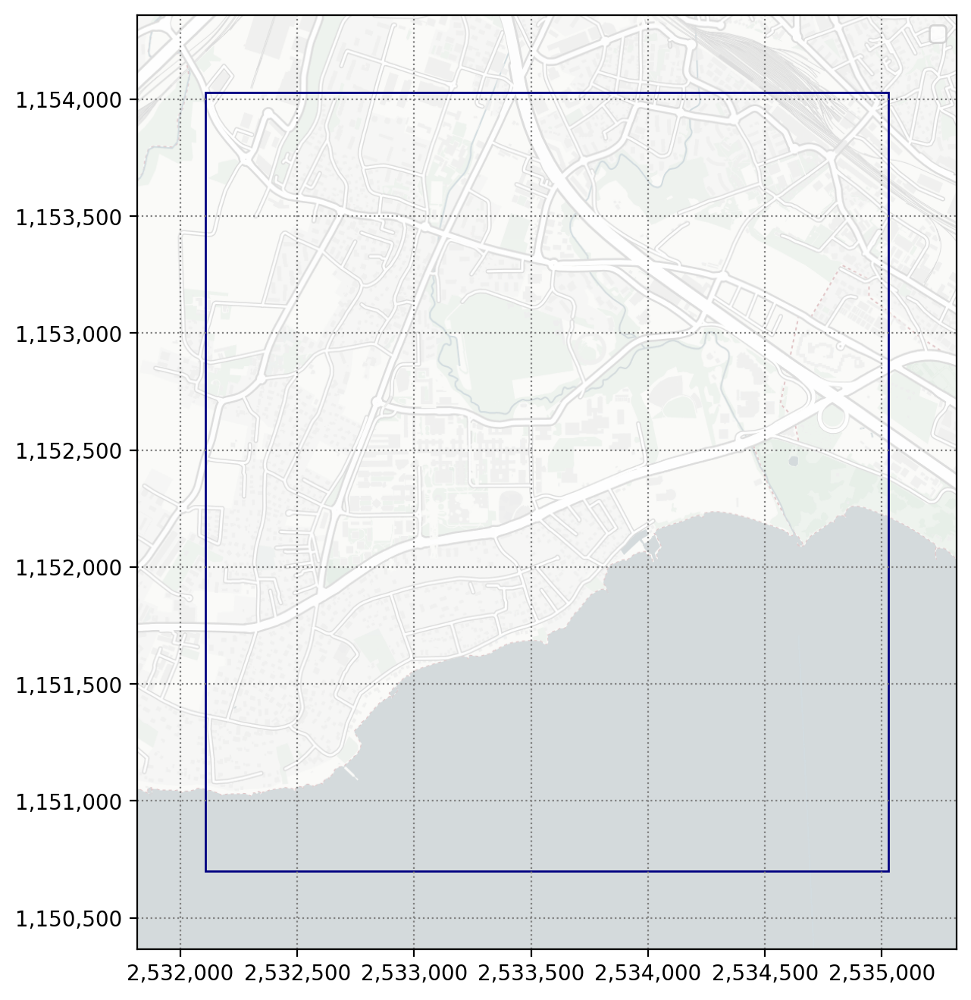

In [6]:
epfl = Area(2532106, 2535027, 1150700, 1154028)
epfl.plot(margin=0.1)

## Tasks.geostat.STAT

> Children : Tasks.geostat.STATPOP, Tasks.geostat.STATENT

A class that has capacity to generate dots for data that comes per hectare. Hectares are randomly chosen based on one of the statistics (number of people living there, etc...) and a random point in the selected hectare is then generated

In [7]:
from RealDataSimulation.Tasks.geostat import STATPOP, STATENT

### Tasks.geostat.STATPOP

In [16]:
population = STATPOP(epfl)
population.df

,POSITION_X,POSITION_Y,POPULATION
18317,2532100,1151000,6
18318,2532100,1151100,6
18319,2532100,1151200,9
18320,2532100,1151300,30
18321,2532100,1151400,73
...,...,...,...
20105,2535000,1153200,54
20106,2535000,1153300,3
20107,2535000,1153800,52
20108,2535000,1153900,98


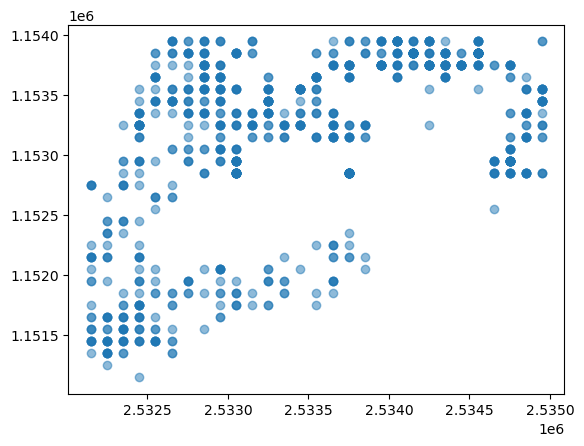

array([[2532250., 1151350.],
       [2533850., 1153850.],
       [2534250., 1153750.],
       ...,
       [2532850., 1153650.],
       [2534650., 1152850.],
       [2532350., 1151650.]], shape=(1000, 2))

In [17]:
pop_demand = population.generate_n(1000, seed = 10)
plt.scatter(pop_demand[:, 0], pop_demand[:, 1], alpha=0.5)
plt.show()
pop_demand

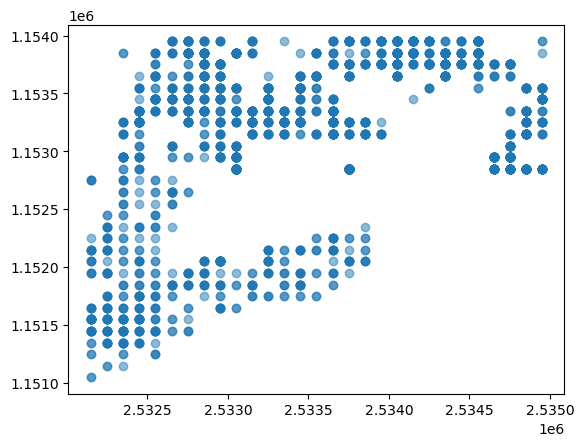

In [18]:
pop_demand2 = population.generate_per_proportion(0.1, seed = 100)
plt.scatter(pop_demand2[:, 0], pop_demand2[:, 1], alpha=0.5)

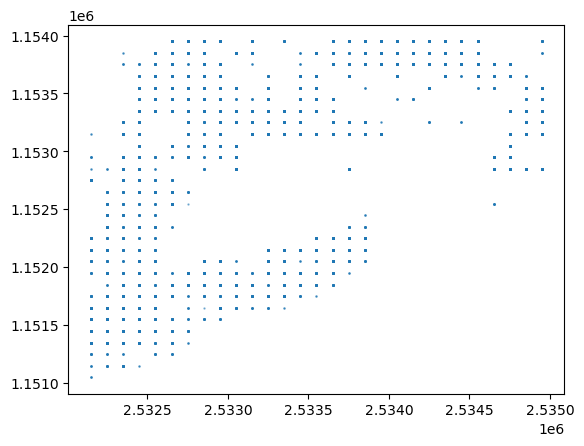

array([[2534750., 1153750.],
       [2532650., 1153850.],
       [2532850., 1152050.],
       ...,
       [2534750., 1152950.],
       [2532750., 1153250.],
       [2534050., 1153750.]], shape=(27262, 2))

In [19]:
pop_demand_jitter = population.generate_per_proportion(proportion=1, precision_in_meter=1, seed = 100)
plt.scatter(pop_demand_jitter[:, 0], pop_demand_jitter[:, 1], alpha=0.5, s=0.5)
plt.show()
pop_demand_jitter

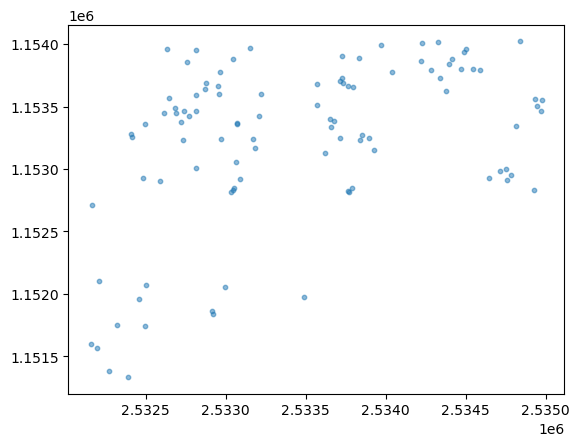

In [20]:
pop_demand_jitter = population.generate_n(100, precision_in_meter=1, seed = 100)
plt.scatter(pop_demand_jitter[:, 0], pop_demand_jitter[:, 1], alpha=0.5, s=10)
plt.show()

### Tasks.geostat.STATENT

In [21]:
statent = STATENT(epfl)
statent.df

,POSITION_X,POSITION_Y,SHOPS,SHOPS_EMP,SHOPS_ETP,SHOPS_0,SHOPS_10,SHOPS_50,SHOPS_250
12331,2532100,1151300,0,0,0.0,0,0,0,0
12332,2532100,1151400,0,0,0.0,0,0,0,0
12333,2532100,1151500,0,0,0.0,0,0,0,0
12334,2532100,1151700,0,0,0.0,0,0,0,0
12335,2532100,1151900,0,0,0.0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
13730,2535000,1153600,0,0,0.0,0,0,0,0
13731,2535000,1153700,0,0,0.0,0,0,0,0
13732,2535000,1153800,0,0,0.0,0,0,0,0
13733,2535000,1153900,4,4,4.0,4,0,0,0


In [22]:
entreprises = statent.get_entreprises(1, seed=100)
entreprises.df

,POSITION_X,POSITION_Y,SHOPS_EMP,SHOPS_ETP
0,2532264.5,1152464.5,1.00,1.000000
1,2532248.5,1152499.5,1.00,1.000000
2,2532204.5,1152465.5,1.00,1.000000
3,2532204.5,1152469.5,1.00,1.000000
4,2532373.5,1151305.5,3.75,2.904415
...,...,...,...,...
209,2534993.5,1153717.5,3.50,3.004088
210,2534927.5,1153767.5,3.50,3.004088
211,2535008.5,1153298.5,3.25,2.989389
221,2535001.5,1153510.5,1.00,1.000000


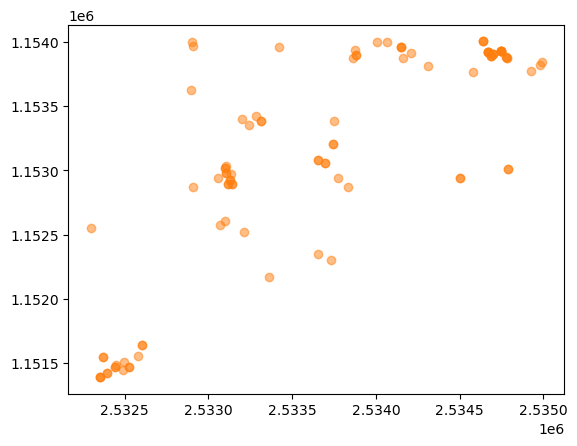

array([[2534700.5, 1153906.5],
       [2532392.5, 1151420.5],
       [2534212.5, 1153911.5],
       [2534744.5, 1153926.5],
       [2533731.5, 1152300.5],
       [2533118.5, 1152892.5],
       [2533096.5, 1152608.5],
       [2534744.5, 1153926.5],
       [2532526.5, 1151467.5],
       [2534579.5, 1153766.5],
       [2534991.5, 1153840.5],
       [2532298.5, 1152549.5],
       [2533654.5, 1153083.5],
       [2534666.5, 1153923.5],
       [2534641.5, 1154005.5],
       [2533131.5, 1152922.5],
       [2534925.5, 1153770.5],
       [2534641.5, 1154005.5],
       [2533773.5, 1152942.5],
       [2532907.5, 1152869.5],
       [2534502.5, 1152941.5],
       [2533315.5, 1153384.5],
       [2533202.5, 1153398.5],
       [2533694.5, 1153056.5],
       [2534149.5, 1153962.5],
       [2534666.5, 1153923.5],
       [2533742.5, 1153201.5],
       [2534784.5, 1153874.5],
       [2532526.5, 1151467.5],
       [2533106.5, 1152981.5],
       [2532576.5, 1151552.5],
       [2534687.5, 1153893.5],
       [

In [23]:
ent_sources = entreprises.generate_n(100, seed = 10)
plt.scatter(ent_sources[:, 0], ent_sources[:, 1], alpha=0.5, c="C1")
plt.show()
ent_sources

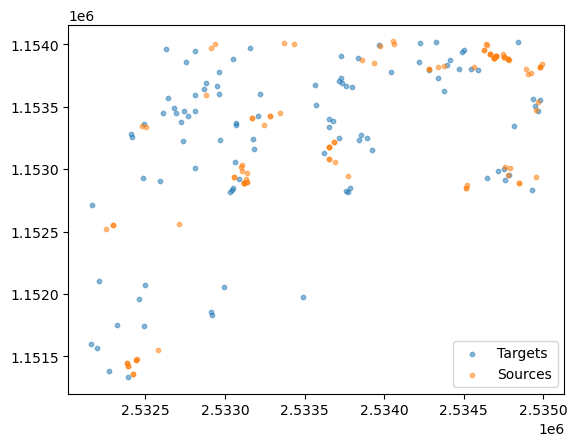

In [24]:
pop_demand_jitter = population.generate_n(100, 1, seed = 100)
plt.scatter(pop_demand_jitter[:, 0], pop_demand_jitter[:, 1], alpha=0.5, s=10, label="Targets")
ent_sources_jitter = entreprises.generate_n(100, seed = 200)
plt.scatter(ent_sources_jitter[:, 0], ent_sources_jitter[:, 1], alpha=0.5, s=10, c="C1", label="Sources")
plt.legend()
plt.show()

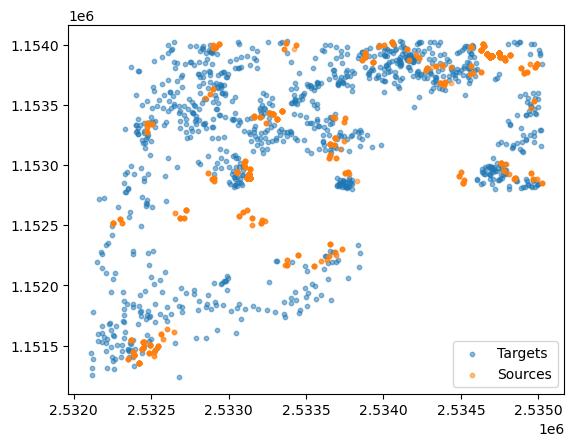

In [25]:
pop_demand_jitter = population.generate_n(1000, 1, seed = 100)
plt.scatter(pop_demand_jitter[:, 0], pop_demand_jitter[:, 1], alpha=0.5, s=10, label="Targets")
ent_sources_jitter = entreprises.generate_n(1000, seed = 200)
plt.scatter(ent_sources_jitter[:, 0], ent_sources_jitter[:, 1], alpha=0.5, s=10, c="C1", label="Sources")
plt.legend()
plt.show()

## TaskManager

In [8]:
from RealDataSimulation.Tasks.taskManager import TaskManager

In [9]:
tasks_manager = TaskManager(epfl, random_seed=100)
tasks_manager.get_tasks(100, random_seed=100)

,pickup_x,pickup_y,delivery_x,delivery_y,distance
0,2533807.5,1152915.5,2533676.5,1153383.5,485.988683
1,2533123.5,1152857.5,2532912.5,1151859.5,1020.061273
2,2533160.5,1153356.5,2533208.5,1153428.5,86.533231
3,2534711.5,1153864.5,2534544.5,1153804.5,177.451402
4,2532307.5,1152479.5,2532158.5,1151597.5,894.497065
...,...,...,...,...,...
95,2532325.5,1152524.5,2534337.5,1153731.5,2346.272150
96,2533728.5,1152280.5,2533728.5,1153905.5,1625.000000
97,2533682.5,1152269.5,2532959.5,1153600.5,1514.691388
98,2533339.5,1153438.5,2534646.5,1152927.5,1403.342439


Lowered zoom level to keep map size reasonable. (z = 14)


c:\Users\arsju\OneDrive\Documents\1 Etudes\EPFL MA3 2024-2025\PROJETS\DRONES\RealDataSimulation\area.py:94: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


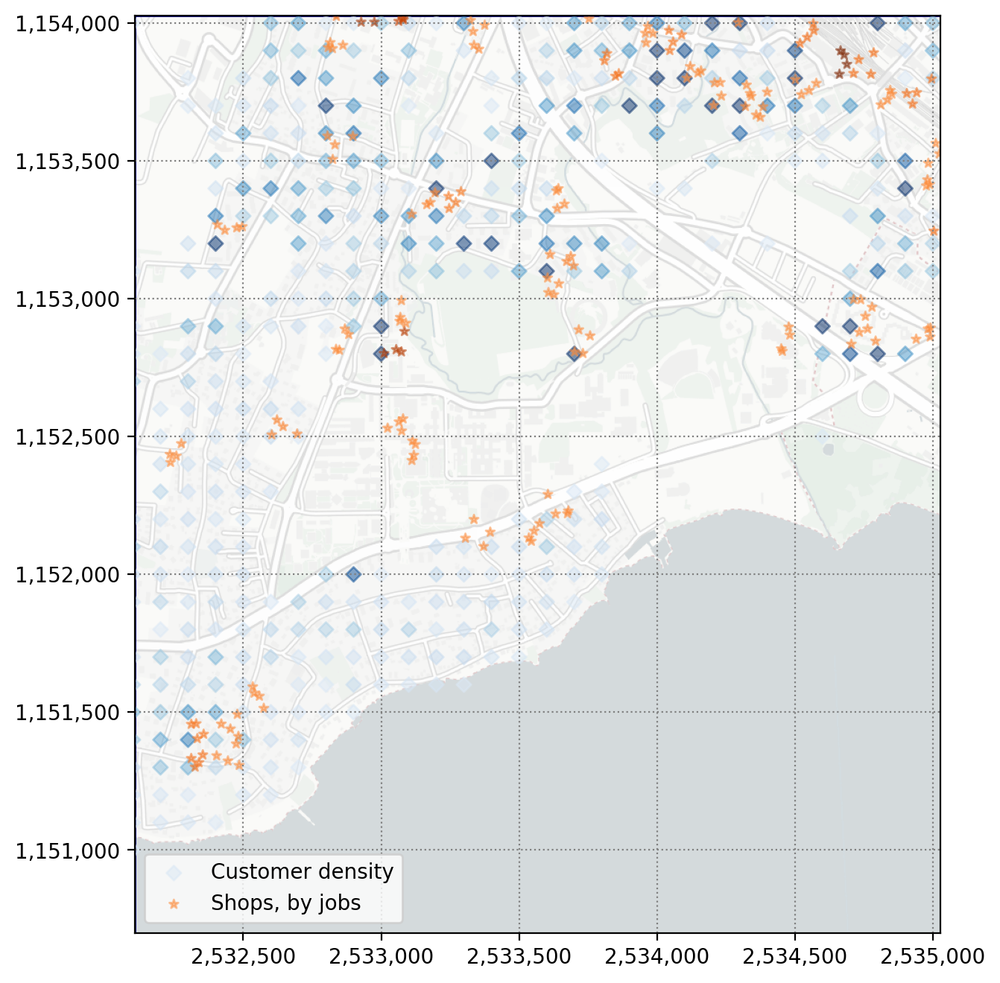

In [10]:
tasks_manager.plot()
plt.legend(scatterpoints=1)

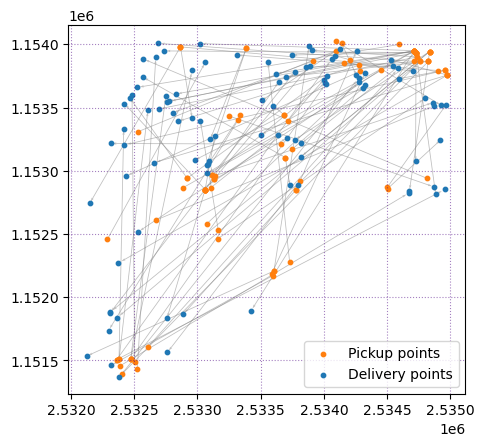

In [11]:
plt.figure()
tasks_manager.plot(plt.gca(), tasks_manager.get_tasks(100))
plt.gca().set_aspect("equal")
plt.grid(linestyle=":", color="indigo", alpha=0.5)
plt.legend(scatterpoints=1)

Lowered zoom level to keep map size reasonable. (z = 14)


c:\Users\arsju\OneDrive\Documents\1 Etudes\EPFL MA3 2024-2025\PROJETS\DRONES\RealDataSimulation\area.py:94: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend()


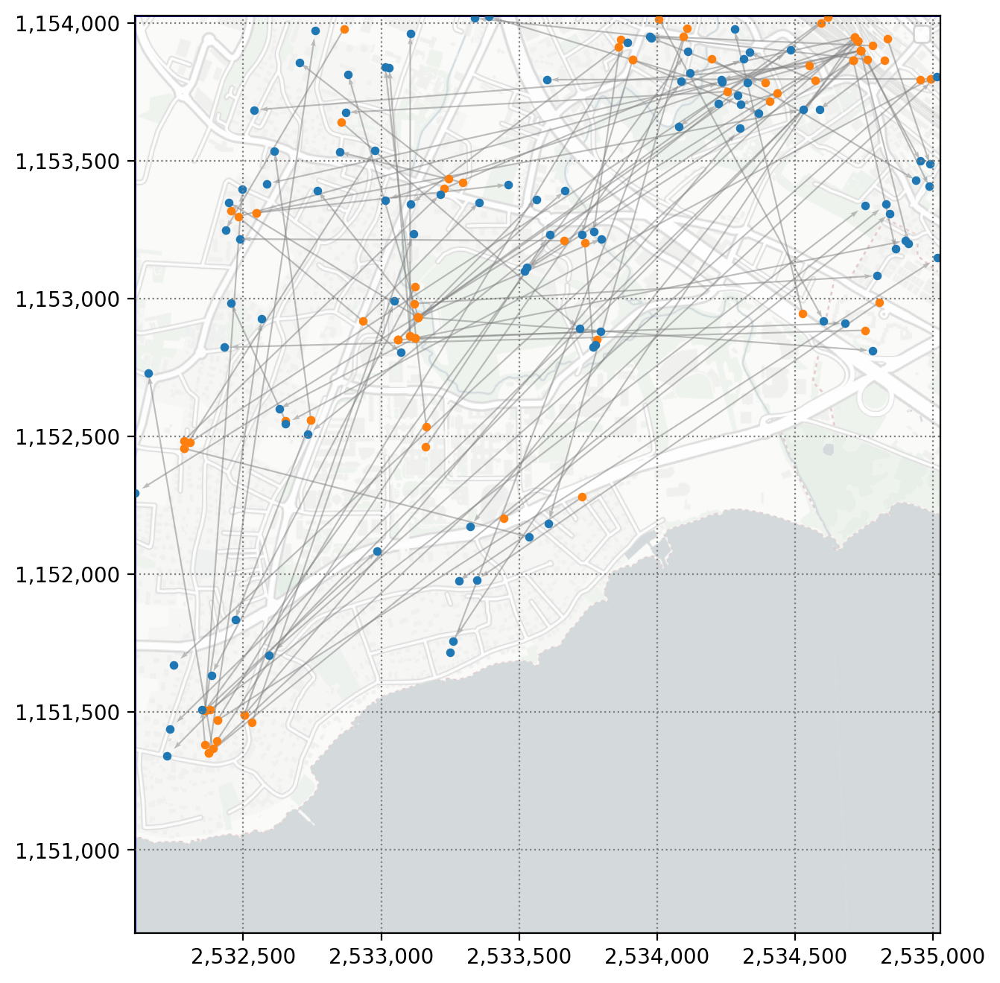

In [12]:
tasks_manager.plot(tasks=tasks_manager.get_tasks(100))

### Map

Lowered zoom level to keep map size reasonable. (z = 14)


C:\Users\arsju\AppData\Local\Temp\ipykernel_8784\452404753.py:2: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


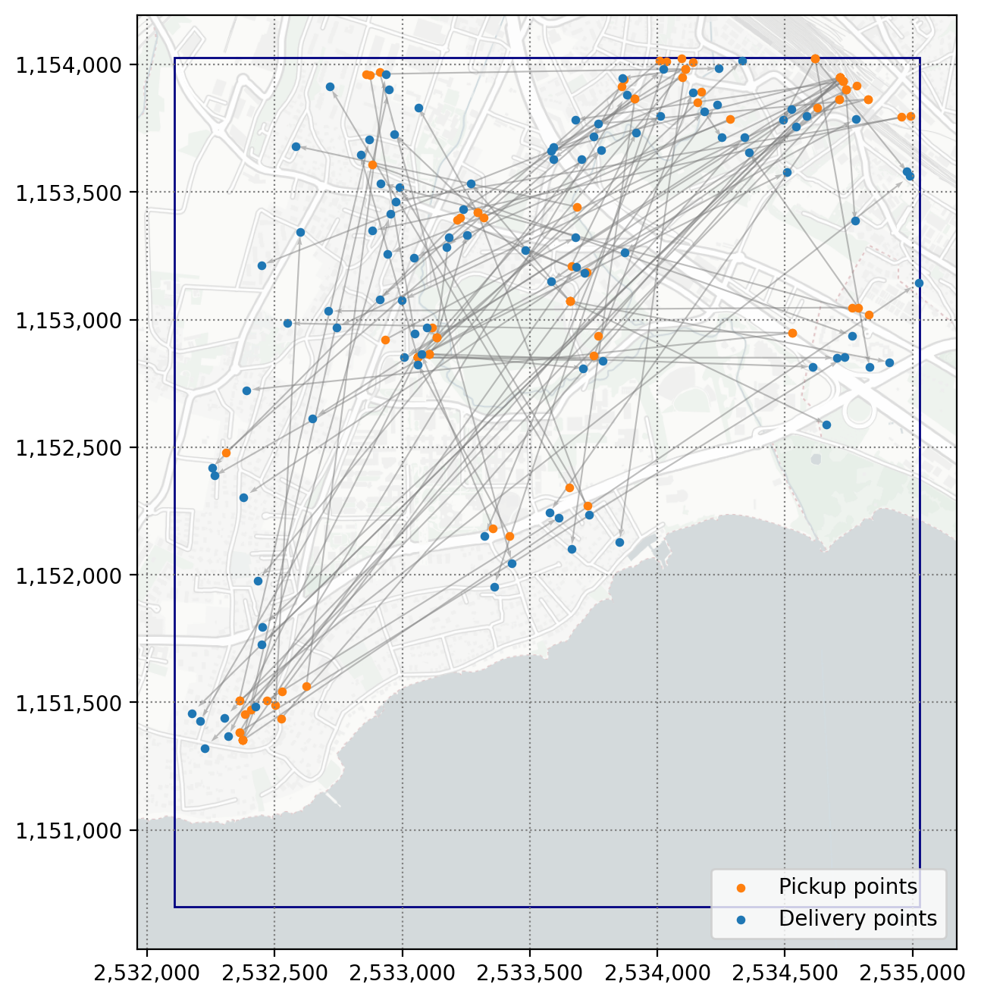

In [13]:
fig, ax = epfl.plot((tasks_manager, tasks_manager.get_tasks(100, random_seed=10)), margin=0.05)
fig.show()

## TransportData

In [14]:
from RealDataSimulation.PublicTransport.processing import TransportData

In [35]:
tp = TransportData("epfl", epfl, date = (2025,1,3))
tp.download_data(date_strict=False)

('raw_data\\1_downloaded\\Stops_2025-01-03.csv',
 'raw_data\\1_downloaded\\Timetable_2025-01-03.csv')

In [36]:
tp.filter_data(return_data=False)

In [37]:
lines = tp.get_lines_data()

85:151:1


c:\Users\arsju\anaconda3\envs\oldFolium\Lib\site-packages\scipy\interpolate\_interpolate.py:479: RuntimeWarning: invalid value encountered in divide
  slope = (y_hi - y_lo) / (x_hi - x_lo)[:, None]


Still 4 distances values missing for line 1 (85:151:1)
                       STOP_NAME  POSITION_X  POSITION_Y  DISTANCE
STOP_NUMBER                                                       
8592001         Lausanne, Boston   2537405.0   1152837.0       NaN
8592010      Lausanne, Chauderon   2537555.0   1152802.0       NaN
8592102         Lausanne, Prélaz   2536612.0   1153116.0       NaN
8592109       Lausanne, Recordon   2537035.0   1153025.0       NaN

Dropping routes Route_G, Route_H, Route_J as their similitude with Route_A is smaller than the threshold (5)
Consequently, dropping journeys 85:151:106, 85:151:137, 85:151:220, 85:151:239, 85:151:134

85:151:24
85:151:25
85:151:31
85:151:32
85:151:33
Removing 154 duplicates for line 33 (85:151:33)
85:151:70
85:151:95
Removing 3 duplicates for line N5 (85:151:95)
85:764:701
Removing 91 duplicates for line 701 (85:764:701)
85:764:705
Removing 2 duplicates for line 705 (85:764:705)


In [39]:
l705 = lines["85:764:705"]
l705.stops

,STOP_NUMBER,POSITION_X,POSITION_Y,DISTANCE,Route_A,Route_B,Route_C,Route_D,Route_E
STOP_NAME,,,,,,,,,
"Lonay, parc",8592254,2.529262e+06,1.153429e+06,0.000000,True,True,False,False,True
"Lonay, Pressoirs",8595219,2.529507e+06,1.153105e+06,406.249783,True,True,False,False,False
"Lonay-Préverenges, gare nord",8511344,2.529439e+06,1.152899e+06,623.392256,True,True,False,False,False
"Lonay-Préverenges, gare sud",8595218,2.529592e+06,1.152847e+06,785.302906,True,True,False,False,True
"Préverenges, Capellan",8588898,2.529954e+06,1.152437e+06,1332.243488,True,True,False,False,True
"Préverenges, village",8579230,2.529987e+06,1.152190e+06,1581.438191,True,True,False,False,True
"Denges, Pierraz-Mur",8592240,2.530776e+06,1.151938e+06,2409.704452,True,True,False,False,True
"Denges, Sur les Moulins",8592241,2.531176e+06,1.151922e+06,2810.056770,True,True,False,False,True
"Denges, La Pale",8592239,2.531209e+06,1.152348e+06,3236.733360,True,True,False,False,True


Lowered zoom level to keep map size reasonable. (z = 14)


(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

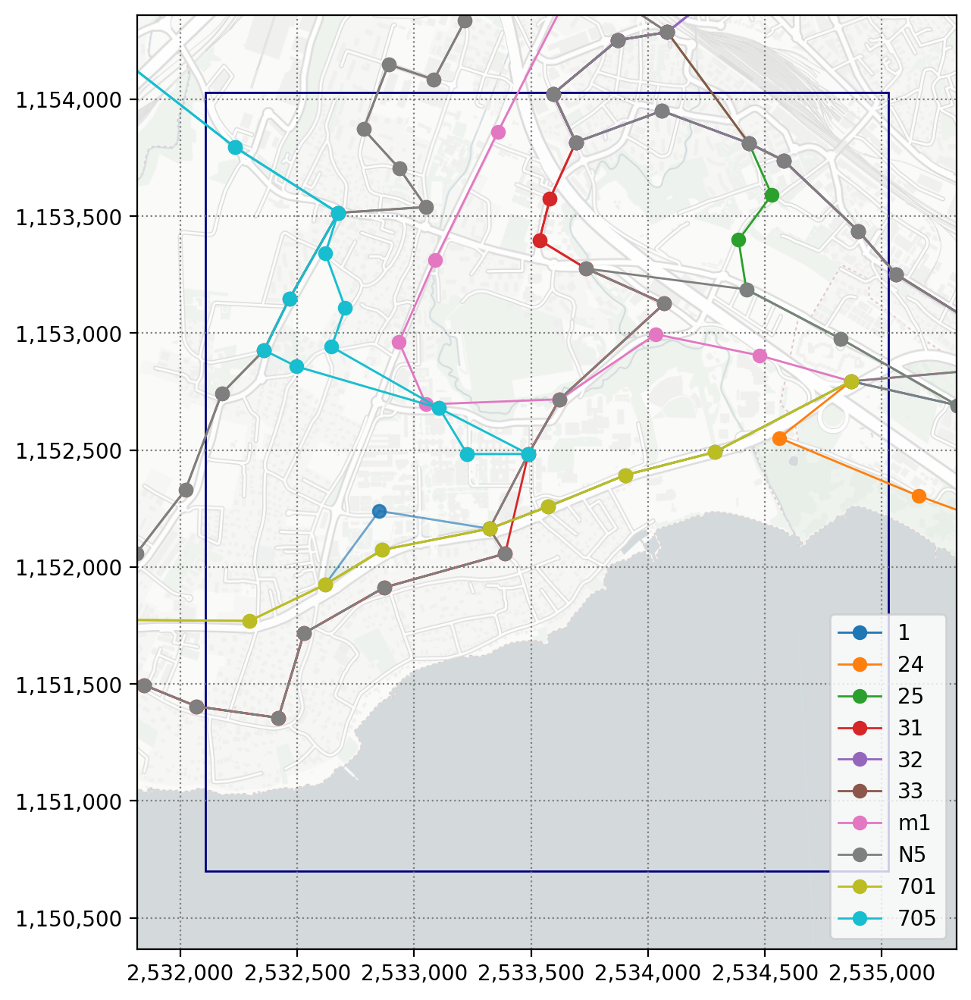

In [42]:
epfl.plot(*lines.values(), margin=0.1)

Lowered zoom level to keep map size reasonable. (z = 13)


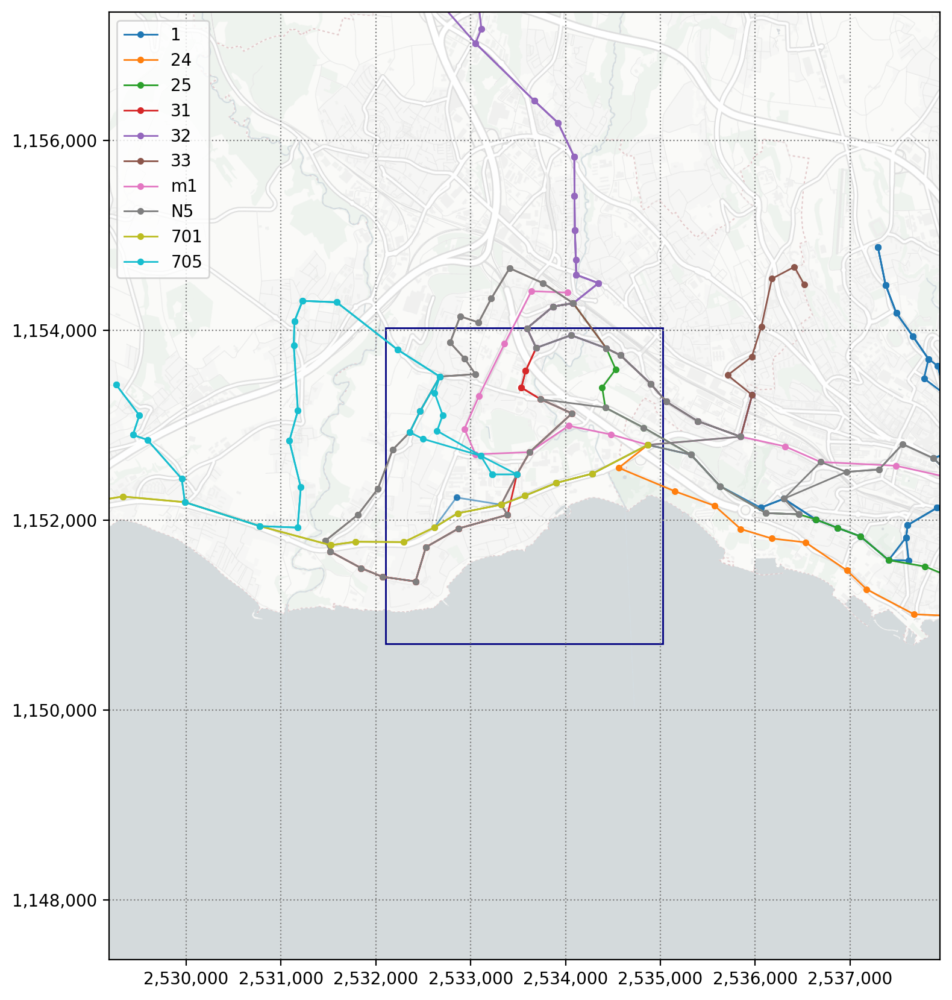

In [52]:
fig, ax = epfl.plot(*lines.values(), margin=1, figsize=(8,10))
plt.show()

## Case study for line 705

In [26]:
tp705 = TransportData("705")
tp705.search_lines("705")

No area or line_id defined. Do not forget to define one when running .filter_data (use .search_lines to see the possibilities)
HTTP Error 404: NOT FOUND
File not found at https://opentransportdata.swiss/fr/dataset/istdaten/resource_permalink/2025-01-08_istdaten.csv (HTTP Error 404: NOT FOUND). Current date : 2025-01-08. Trying an earlier date.
----
Changed date to 2025-01-07
----



,BETREIBER_ABK,BETREIBER_NAME,PRODUKT_ID,LINIEN_ID,LINIEN_TEXT,VERKEHRSMITTEL_TEXT
562529,MBC Auto,Automobiles MBC,Bus,85:764:705,705,B
1485394,BOS/wimo,Bus Ostschweiz (Wil),Bus,85:826:705,705,B
1944433,VBZ,Verkehrsbetriebe Zürich,Bus,85:849:705,705,B


In [27]:
tp705.get_downloaded_filenames()

('raw_data\\1_downloaded\\Stops_2025-01-07.csv',
 'raw_data\\1_downloaded\\Timetable_2025-01-07.csv')

In [28]:
tp705.filter_data("85:764:705")

(         number           designationOfficial      lv95East     lv95North
 108174  8579233       Ecublens VD, EPFL (bus)  2.533107e+06  1.152679e+06
 108249  8579230          Préverenges, village  2.529987e+06  1.152190e+06
 108285  8579234     Ecublens VD, EPFL Piccard  2.533227e+06  1.152483e+06
 129977  8588872             Denges, Les Oches  2.531179e+06  1.153156e+06
 130002  8588898         Préverenges, Capellan  2.529954e+06  1.152437e+06
 130150  8588875             Echandens, centre  2.531142e+06  1.154096e+06
 137423  8591949       Ecublens VD, En Enjalin  2.532358e+06  1.152927e+06
 137454  8591954        Ecublens VD, Perrettes  2.532466e+06  1.153147e+06
 137473  8591952            Ecublens VD, Ormet  2.532495e+06  1.152858e+06
 137534  8591961          Ecublens VD, Villars  2.532675e+06  1.153514e+06
 137540  8591947      Ecublens VD, Coquerellaz  2.532646e+06  1.152941e+06
 137550  8591946          Ecublens VD, Cocarde  2.532620e+06  1.153341e+06
 137578  8591944         

In [29]:
l705 = tp705.generate_timetable()
area705 = tp705.area

85:764:705


Lowered zoom level to keep map size reasonable. (z = 13)


(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

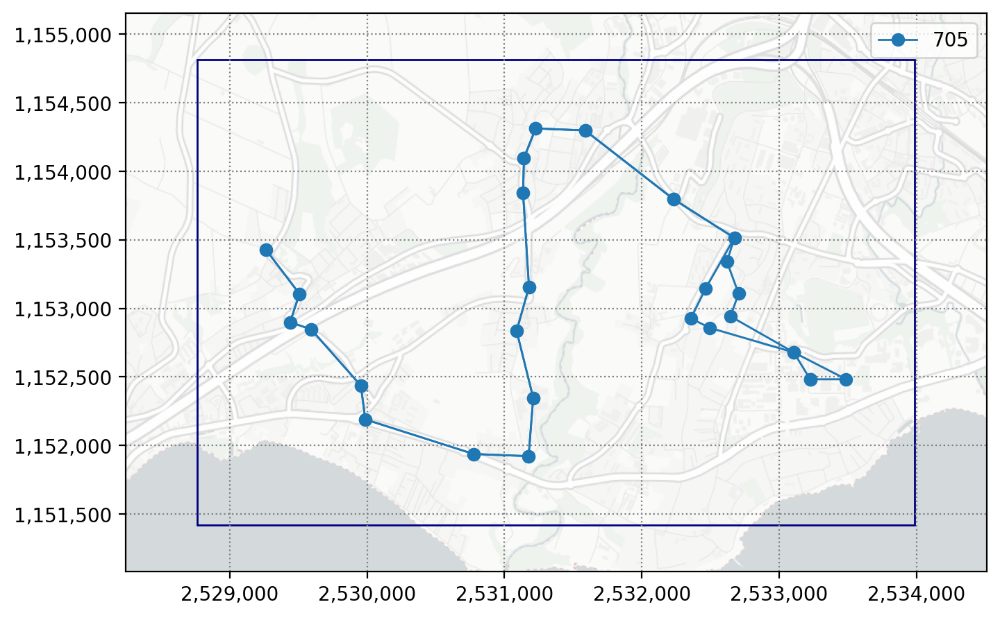

In [34]:
area705.plot(l705, margin=0.1)

Lowered zoom level to keep map size reasonable. (z = 14)


(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

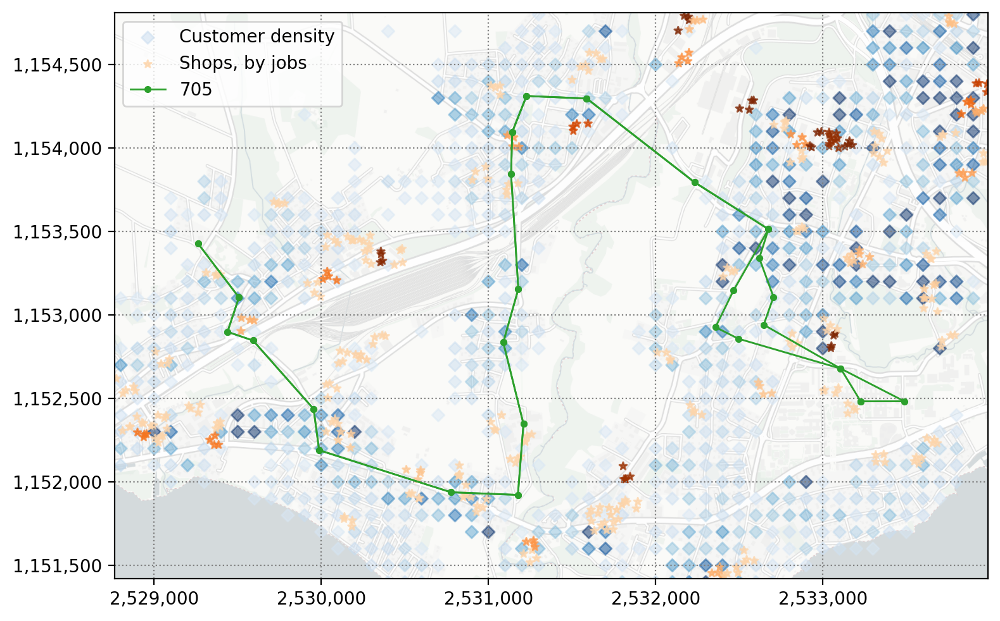

In [73]:
tm = TaskManager(area705, random_seed=2025)
area705.plot(tm, l705)

Lowered zoom level to keep map size reasonable. (z = 14)


(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

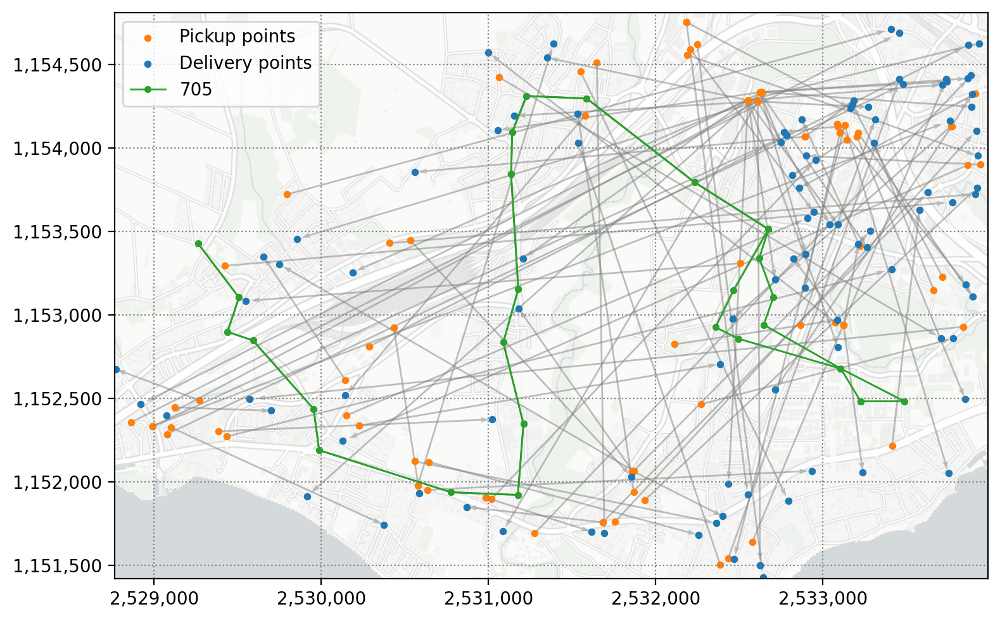

In [74]:
tasks = tm.get_tasks(100)
area705.plot((tm, tasks), l705)

Lowered zoom level to keep map size reasonable. (z = 14)


(<Figure size 1600x1600 with 1 Axes>, <Axes: >)

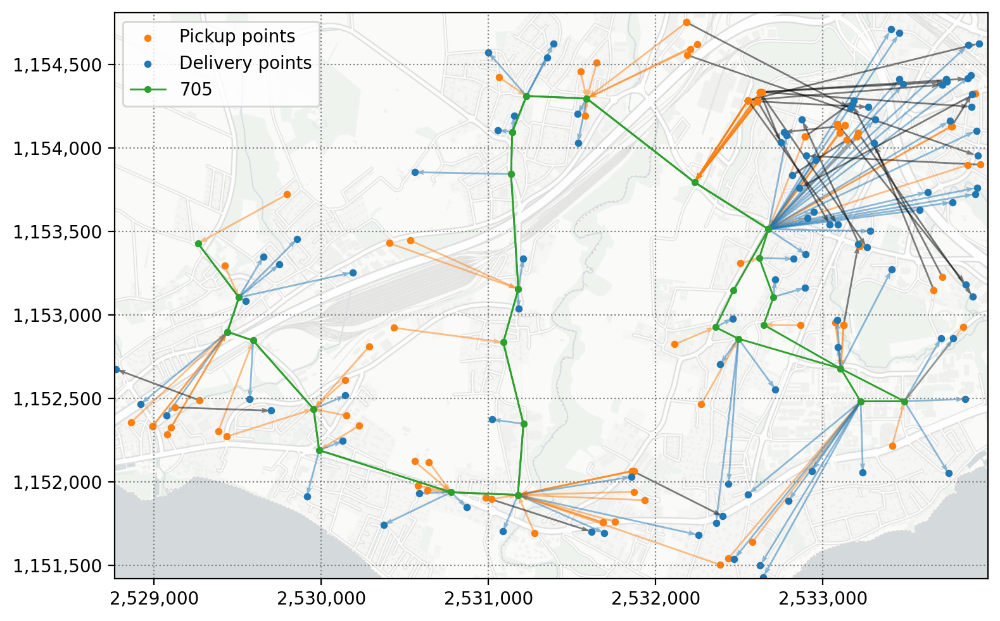

In [114]:
area705.plot((tm, tasks, l705), l705)

### Brol

In [259]:
timetables["85:764:705"]["stops"].convert_dtypes()

,STOP_NUMBER,POSITION_X,POSITION_Y,DISTANCE,Route_A,Route_B,Route_C,Route_D,Route_E
STOP_NAME,,,,,,,,,
"Lonay, parc",8592254,2529262.0,1153429.0,0.0,True,True,False,False,True
"Lonay, Pressoirs",8595219,2529507.31315,1153105.17853,406.249783,True,True,False,False,False
"Lonay-Préverenges, gare nord",8511344,2529438.71944,1152899.15485,623.392256,True,True,False,False,False
"Lonay-Préverenges, gare sud",8595218,2529592.0,1152847.0,785.302906,True,True,False,False,True
"Préverenges, Capellan",8588898,2529954.0,1152437.0,1332.243488,True,True,False,False,True
"Préverenges, village",8579230,2529987.0,1152190.0,1581.438191,True,True,False,False,True
"Denges, Pierraz-Mur",8592240,2530776.0,1151938.0,2409.704452,True,True,False,False,True
"Denges, Sur les Moulins",8592241,2531176.04448,1151922.30311,2810.05677,True,True,False,False,True
"Denges, La Pale",8592239,2531209.31847,1152347.6803,3236.73336,True,True,False,False,True


JOURNEY_ID,85:764:5001_705-A-101_0540_BNE5,85:764:5003_705-A-101_0600_BNE5,85:764:5000_705-R-201_0618_BNE5,85:764:5005_705-A-101_0620_BNE5,85:764:5007_705-A-101_0635_BNE5,85:764:5002_705-R-201_0638_BNE5,85:764:5009_705-A-101_0650_BNE5,85:764:5004_705-R-201_0658_BNE5,85:764:5011_705-A-101_0700_BNE5,85:764:5006_705-R-203_0713_BNE5,...,85:764:5131_705-A-101_2200_BNE5,85:764:5130_705-R-201_2230_BNE5,85:764:5133_705-A-101_2230_BNE5,85:764:5135_705-A-101_2300_BNE5,85:764:5132_705-R-201_2300_BNE5,85:764:5134_705-R-201_2330_BNE5,85:764:5137_705-A-101_2330_BNE5,85:764:5136_705-R-201_2400_BNE5,85:764:5139_705-A-101_2400_BNE5,85:764:5138_705-R-201_2430_BNE5
STOP_NAME,,,,,,,,,,,,,,,,,,,,,
"Denges, La Pale",8.0,8.0,13.0,8.0,8.0,13.0,8.0,13.0,8.0,-1.0,...,8.0,13.0,8.0,8.0,13.0,13.0,8.0,13.0,8.0,13.0
"Denges, Les Oches",10.0,10.0,11.0,10.0,10.0,11.0,10.0,11.0,10.0,-1.0,...,10.0,11.0,10.0,10.0,11.0,11.0,10.0,11.0,10.0,11.0
"Denges, Pierraz-Mur",6.0,6.0,15.0,6.0,6.0,15.0,6.0,15.0,6.0,-1.0,...,6.0,15.0,6.0,6.0,15.0,15.0,6.0,15.0,6.0,15.0
"Denges, Sur les Moulins",7.0,7.0,14.0,7.0,7.0,14.0,7.0,14.0,7.0,-1.0,...,7.0,14.0,7.0,7.0,14.0,14.0,7.0,14.0,7.0,14.0
"Denges, village",9.0,9.0,12.0,9.0,9.0,12.0,9.0,12.0,9.0,-1.0,...,9.0,12.0,9.0,9.0,12.0,12.0,9.0,12.0,9.0,12.0
"Echandens, Chocolatière",14.0,14.0,7.0,14.0,14.0,7.0,14.0,7.0,14.0,7.0,...,14.0,7.0,14.0,14.0,7.0,7.0,14.0,7.0,14.0,7.0
"Echandens, Riaz",13.0,13.0,8.0,13.0,13.0,8.0,13.0,8.0,13.0,8.0,...,13.0,8.0,13.0,13.0,8.0,8.0,13.0,8.0,13.0,8.0
"Echandens, centre",12.0,12.0,9.0,12.0,12.0,9.0,12.0,9.0,12.0,9.0,...,12.0,9.0,12.0,12.0,9.0,9.0,12.0,9.0,12.0,9.0
"Echandens, collège",11.0,11.0,10.0,11.0,11.0,10.0,11.0,10.0,11.0,-1.0,...,11.0,10.0,11.0,11.0,10.0,10.0,11.0,10.0,11.0,10.0


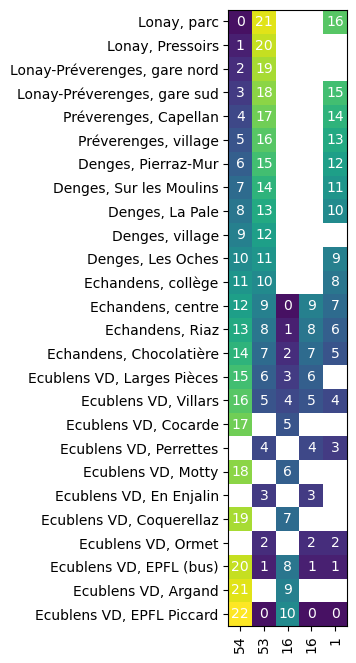

In [206]:
line_timetable: pd.DataFrame = timetables["85:764:705"]["real"]
journeys = line_timetable.groupby("STOP_NAME", sort=False).first()

journeys = journeys.apply(lambda x : x.dropna().sort_values().argsort(), axis=0).fillna(-1)
display(journeys)

unique_journeys = journeys.T.value_counts().reset_index().astype("int").set_index("count").T
unique_journeys = unique_journeys.sort_index(key=lambda x: x.map(timetables["85:764:705"]["stops"].DISTANCE))

#display(unique_journeys)
plt.figure(figsize = (8,8))
plt.imshow(unique_journeys, alpha=(unique_journeys>=0).astype("short"))
plt.xticks(np.arange(len(unique_journeys.columns)),unique_journeys.columns, rotation=90)
plt.yticks(np.arange(len(unique_journeys.index)),unique_journeys.index)

ax = plt.gca()
for i in range(unique_journeys.shape[0]):
    for j in range(unique_journeys.shape[1]):
        text = ax.text(j, i, unique_journeys.iloc[i, j],
                       ha="center", va="center", color="w")
plt.show()


count,2,2,1,1,1
"Lonay, parc",False,True,False,True,True
"Lonay, Pressoirs",False,True,False,False,True
"Lonay-Préverenges, gare nord",False,True,False,False,True
"Lonay-Préverenges, gare sud",False,True,False,True,True
"Préverenges, Capellan",False,True,False,True,True
"Préverenges, village",False,True,False,True,True
"Denges, Pierraz-Mur",False,True,False,True,True
"Denges, Sur les Moulins",False,True,False,True,True
"Denges, La Pale",False,True,False,True,True
"Denges, village",False,True,False,False,True


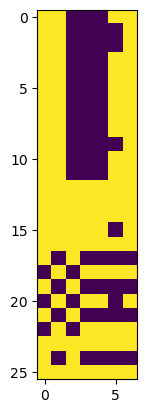

In [185]:
mask = unique_journeys >= 0
plt.imshow(mask)
mask.T.value_counts().reset_index().set_index("count").T

In [202]:
line_timetable.iloc(axis=0)[:, ::-1, :]

IndexingError: Too many indexers

## Brol

In [45]:
df = pd.DataFrame({12: [1,2,3], 22: [3,4,5]})
a, b = df.values.T
a, b

(array([1, 2, 3]), array([3, 4, 5]))

In [6]:
a = np.arange(10).reshape((-1,2))
a[:3]

array([[0, 1],
       [2, 3],
       [4, 5]])

In [2]:
import numpy as np

In [141]:
np.random.Generator.integers(5, size=(10,2)) * 20

TypeError: integers() takes at least 1 positional argument (0 given)

In [145]:
np.random.default_rng?

Signature:      np.random.default_rng(seed=None)
Call signature: np.random.default_rng(*args, **kwargs)
Type:           cython_function_or_method
String form:    <cyfunction default_rng at 0x000002173823DA40>
Docstring:     
default_rng(seed=None)
Construct a new Generator with the default BitGenerator (PCG64).

    Parameters
    ----------
    seed : {None, int, array_like[ints], SeedSequence, BitGenerator, Generator, RandomState}, optional
        A seed to initialize the `BitGenerator`. If None, then fresh,
        unpredictable entropy will be pulled from the OS. If an ``int`` or
        ``array_like[ints]`` is passed, then all values must be non-negative and will be
        passed to `SeedSequence` to derive the initial `BitGenerator` state. One may also
        pass in a `SeedSequence` instance.
        Additionally, when passed a `BitGenerator`, it will be wrapped by
        `Generator`. If passed a `Generator`, it will be returned unaltered.
        When passed a legacy `Rando

In [32]:
from datetime import datetime

In [33]:
datetime1 = datetime(2024, 12, 10, 12, 0, 0)
datetime1.date()

datetime.date(2024, 12, 10)

In [34]:
df = pd.read_csv("data/1_downloaded/Timetable_2024-12-10.csv", sep=";", low_memory=False)
df.sample(5)

,BETRIEBSTAG,FAHRT_BEZEICHNER,BETREIBER_ID,BETREIBER_ABK,BETREIBER_NAME,PRODUKT_ID,LINIEN_ID,LINIEN_TEXT,UMLAUF_ID,VERKEHRSMITTEL_TEXT,...,FAELLT_AUS_TF,BPUIC,HALTESTELLEN_NAME,ANKUNFTSZEIT,AN_PROGNOSE,AN_PROGNOSE_STATUS,ABFAHRTSZEIT,AB_PROGNOSE,AB_PROGNOSE_STATUS,DURCHFAHRT_TF
2284556,10.12.2024,85:883:66739-0,85:883,BSU,Busbetrieb Solothurn und Umgebung,Bus,85:883:7,7,723,B,...,False,8587367,"Röthenbach b. H., Rest. Post",10.12.2024 10:45,10.12.2024 10:46:43,REAL,10.12.2024 10:45,10.12.2024 10:46:56,REAL,False
2060988,10.12.2024,85:881:TPG009-4503784321757755,85:881,TPG,Transports Publics Genevois,Bus,85:881:TPG009,9,NaN,B,...,False,8592797,"Genève, Camille-Martin",10.12.2024 15:57,10.12.2024 15:56:11,PROGNOSE,10.12.2024 15:57,10.12.2024 15:56:25,PROGNOSE,False
2040823,10.12.2024,85:881:TPG005-4503784321268771,85:881,TPG,Transports Publics Genevois,Bus,85:881:TPG005,5,NaN,B,...,False,8592950,"Grand-Saconnex, Palexpo",10.12.2024 14:23,10.12.2024 14:23:03,PROGNOSE,10.12.2024 14:23,10.12.2024 14:23:29,PROGNOSE,False
2137707,10.12.2024,85:881:TPG022-4503784321217168,85:881,TPG,Transports Publics Genevois,Bus,85:881:TPG022,22,NaN,B,...,False,8587437,"Carouge GE, Rondeau",10.12.2024 13:14,10.12.2024 13:12:06,PROGNOSE,NaN,NaN,NaN,False
1197477,10.12.2024,85:811:70351-0070,85:811,AAGL,Autobus AG Liestal,Bus,85:811:70,70,NaN,B,...,False,8578323,Bubendorf Unterdorf,10.12.2024 12:39,10.12.2024 12:41:38,REAL,10.12.2024 12:39,10.12.2024 12:41:39,REAL,False


In [35]:
df.PRODUKT_ID.value_counts()

PRODUKT_ID
Bus            1920328
Tram            253166
Zug             163500
BUS             112255
Metro             5101
Zahnradbahn       1653
Schiff             176
Name: count, dtype: int64

In [44]:
', '.join(df.PRODUKT_ID.iloc[:5].astype(str))

'Zug, Zug, Zug, Zug, Zug'

In [47]:
df.ANKUNFTSZEIT.is_unique

False